 In this notebook we're going to scale up from using 10 classes of the Food101 data to using all of the classes in the Food101 dataset.

Our goal is to beat the original Food101 paper's results with 10% of data.

Our baseline is to beat the 50.76% accuracy across 101 classes.

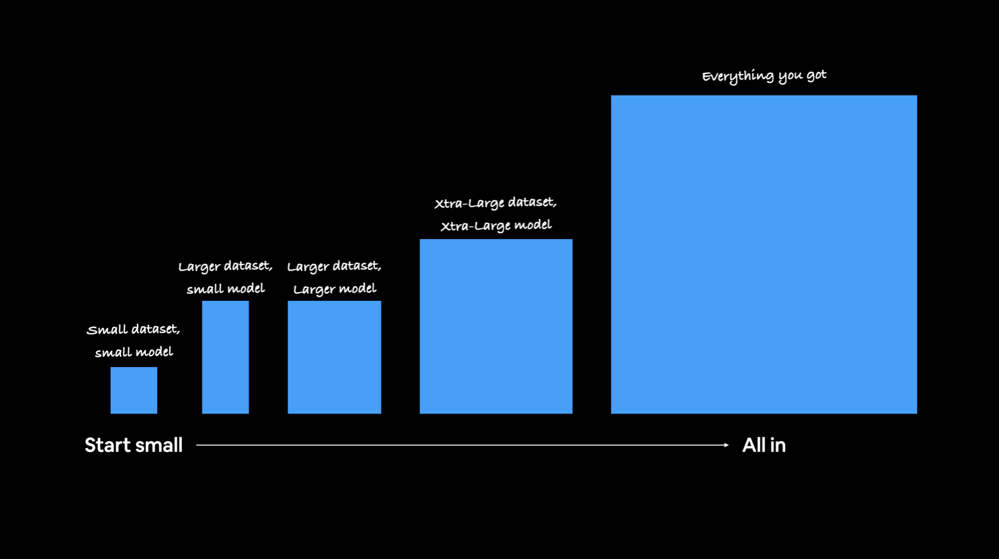

In [1]:
!nvidia-smi

Wed Jul 31 22:41:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   68C    P8              20W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import datetime
print(f"Notebook last run (end-to-end): {datetime.datetime.now()}")

Notebook last run (end-to-end): 2024-07-31 22:41:21.177107


## Creating Helper Functions

In previos notebooks, we created a series of helper function, so we will download them.

In [3]:
# Get helper functions file
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

--2024-07-31 22:41:21--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py.1’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0.001s  

2024-07-31 22:41:21 (14.8 MB/s) - ‘helper_functions.py.1’ saved [10246/10246]



In [4]:
# Import series of helper functions for our notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir

## 101 Food Classes: Working with less data

So far we've confirmed the transfer learning model's we've been using work pretty well with the 10 Food Classes dataset. Now it's time to step it up and see how they go with the full 101 Food Classes.

In the original Food101 dataset there's 1000 images per class (750 of each class in the training set and 250 of each class in the test set), totalling 101,000 imags.

We could start modelling straight away on this large dataset but in the spirit of continually experimenting, we're going to see how our previously working model's go with 10% of the training data.

This means for each of the 101 food classes we'll be building a model on 75 training images and evaluating it on 250 test images.

In [5]:
# Download data from Google Storage (already preformatted)
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip

unzip_data("101_food_classes_10_percent.zip")

# setting up training and testing directories
train_dir = "101_food_classes_10_percent/train/"
test_dir = "101_food_classes_10_percent/test/"

--2024-07-31 22:41:24--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.141.207, 142.251.2.207, 74.125.137.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.141.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: ‘101_food_classes_10_percent.zip.1’

101_food_classes_10 100%[===================>]   1.51G   208MB/s    in 9.6s    

2024-07-31 22:41:34 (162 MB/s) - ‘101_food_classes_10_percent.zip.1’ saved [1625420029/1625420029]



In [6]:
## look at the images/classes
walk_through_dir("101_food_classes_10_percent")

There are 2 directories and 0 images in '101_food_classes_10_percent'.
There are 101 directories and 0 images in '101_food_classes_10_percent/test'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/mussels'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/tuna_tartare'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/baklava'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/onion_rings'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/beef_carpaccio'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/chicken_wings'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/gyoza'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/chocolate_mousse'.
There are 0 directories and 250 images in '101_food_classes_10_percent/test/tiramisu'.
There are 0 directories and 250 images in '101_

In [7]:
## Setup Data Inputs
import tensorflow as tf
IMG_SIZE = (224,224)

# training data flow
train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                                label_mode = "categorical",
                                                                                image_size = IMG_SIZE)

# test data flow
test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode = "categorical",
                                                                image_size = IMG_SIZE,
                                                                shuffle = False) # do not shuffle test data for prediction analysis

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


Wonderful! It looks like our data has been imported as expected with 75 images per class in the training set (75 images * 101 classes = 7575 images) and 25250 images in the test set (250 images * 101 classes = 25250 images).

## Train a BIG MODEL with transfer learning on 10% of 101 food classes
Our food image data has been imported into TensorFlow, time to model it.

To keep our experiments swift, we're going to start by using feature extraction transfer learning with a pre-trained model for a few epochs and then fine-tune for a few more epochs.

More specifically, our goal will be to see if we can beat the baseline from original Food101 paper (50.76% accuracy on 101 classes) with 10% of the training data and the following modelling setup:

- A `ModelCheckpoint` callback to save our progress during training, this means we could experiment with further training later without having to train from scratch every time
- Data augmentation built right into the model
- A headless (no top layers) `EfficientNetB0` architecture from tf.keras.applications as our base model
- A `Dense` layer with 101 hidden neurons (same as number of food classes) and softmax activation as the output layer
- `Categorical crossentropy` as the loss function since we're dealing with more than two classes
- The `Adam` optimizer with the default settings
- Fitting for 5 full passes on the training data while evaluating on 15% of the test data


We start by creating the ModelCheckpoint callback.

Since we want our model to perform well on unseen data we'll set it to monitor the validation accuracy metric and save the model weights which score the best on that.

In [8]:
# create checkpoint callback

#(we put "".weights.h5" extension because we are setting save_weights_only=True in our callback)
checkpoint_path = "101_classes_10_percent_data_model_checkpoint.weights.h5"


checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                         save_weights_only = True,
                                                         monitor = "val_accuracy",
                                                         save_best_only = True)

In [9]:
# create data augmentation layer to incorporate it right into the model
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential


# setup data augmentation
data_augmentation = Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2)
    # layers.Rescaling(1/255.) not needed for efficientNet
], name = "data_augmentation")

Beautiful! We'll be able to insert the `data_augmentation` Sequential model as a layer in our Functional API model. That way if we want to continue training our model at a later time, the data augmentation is already built right in.

Speaking of Functional API model's, time to put together a feature extraction transfer learning model using `tf.keras.applications.efficientnet.EfficientNetB0` as our base model.

We'll import the base model using the parameter `include_top=False` so we can add on our own output layers, notably `GlobalAveragePooling2D()` (condense the outputs of the base model into a shape usable by the output layer) followed by a Dense layer.

In [10]:
# Setup the base model and freeze its layers (thi will extract features)
base_model = tf.keras.applications.efficientnet.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setup model architechtures with trainable top layers
inputs = layers.Input(shape = (224,224,3), name="input_layer") # shape of input image
x = data_augmentation(inputs) # augment images (only happens during training)
x = base_model(x, training=False) # put the base model in inference model so we can use to extract features without updating the weights
x = layers.GlobalAveragePooling2D(name = "global_average_pooling")(x) # pool the outputs of the base model
outputs = layers.Dense(len(train_data_all_10_percent.class_names),
                       activation="softmax",
                       name="output_layer")(x) # same number of output neurons as the classes in training data

model = tf.keras.Model(inputs, outputs)

In [11]:
# Get a summary of model we've created
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, None, None, 1280)    │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling               │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 101)                 │         129,381 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,178,952 (15.94 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

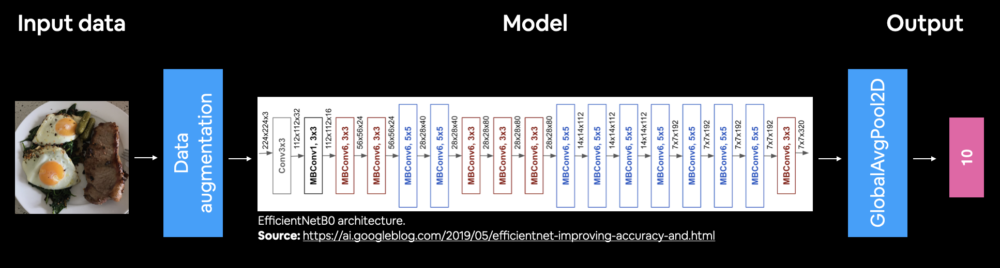

In [12]:
# Compile the Model
model.compile(loss = "categorical_crossentropy",
              optimizer = tf.keras.optimizers.Adam(),
              metrics = ["accuracy"])

# Fit the Model
history_all_classes_10_percent = model.fit(train_data_all_10_percent,
                                           epochs = 5, # fit for 5 epochs
                                           validation_data = test_data,
                                           validation_steps = int(0.15 * len(test_data)), # evaluate on smaller test data
                                           callbacks = [checkpoint_callback]) # save the best model weights to file

Epoch 1/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.1306 - loss: 4.0860 - val_accuracy: 0.3546 - val_loss: 2.8011
Epoch 2/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 26s 109ms/step - accuracy: 0.4104 - loss: 2.5994 - val_accuracy: 0.4322 - val_loss: 2.2910
Epoch 3/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step - accuracy: 0.4734 - loss: 2.1869 - val_accuracy: 0.5466 - val_loss: 1.8920
Epoch 4/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - accuracy: 0.5276 - loss: 1.9551 - val_accuracy: 0.5885 - val_loss: 1.7109
Epoch 5/5
237/237 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step - accuracy: 0.5527 - loss: 1.8098 - val_accuracy: 0.6083 - val_loss: 1.5870


In [13]:
# Evaluate the model on the complete test data
model.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - accuracy: 0.5077 - loss: 1.9294


[1.8130347728729248, 0.5332673192024231]

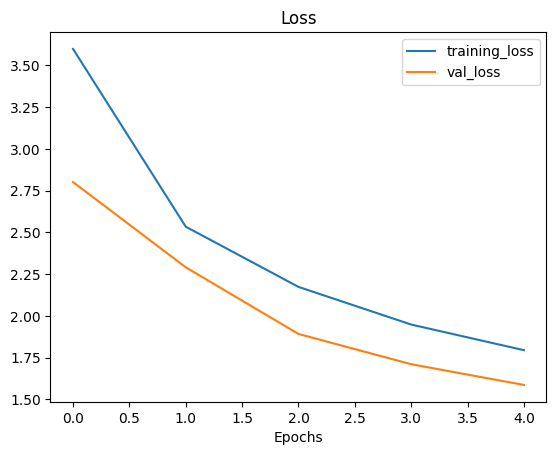

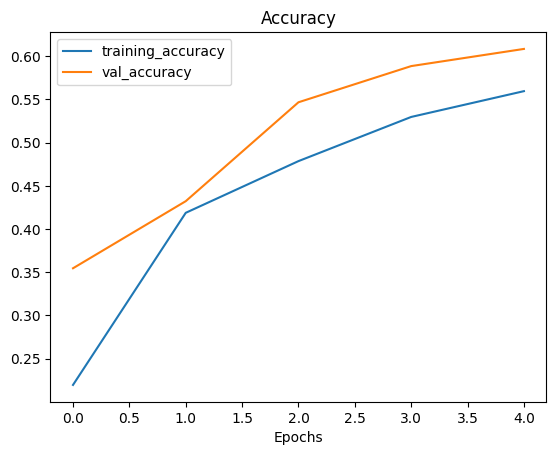

In [14]:
plot_loss_curves(history_all_classes_10_percent)

## Fine Tuning

Our feature extraction transfer learning model is performing well. Why don't we try to fine-tune a few layers in the base model and see if we gain any improvements?

The good news is, thanks to the `ModelCheckpoint callback`, we've got the saved weights of our already well-performing model so if fine-tuning doesn't add any benefits, we can revert back.

To fine-tune the base model we'll first set its `trainable` attribute to `True`, unfreezing all of the frozen.

Then since we've got a relatively small training dataset, we'll refreeze every layer except for the last 5, making them trainable.

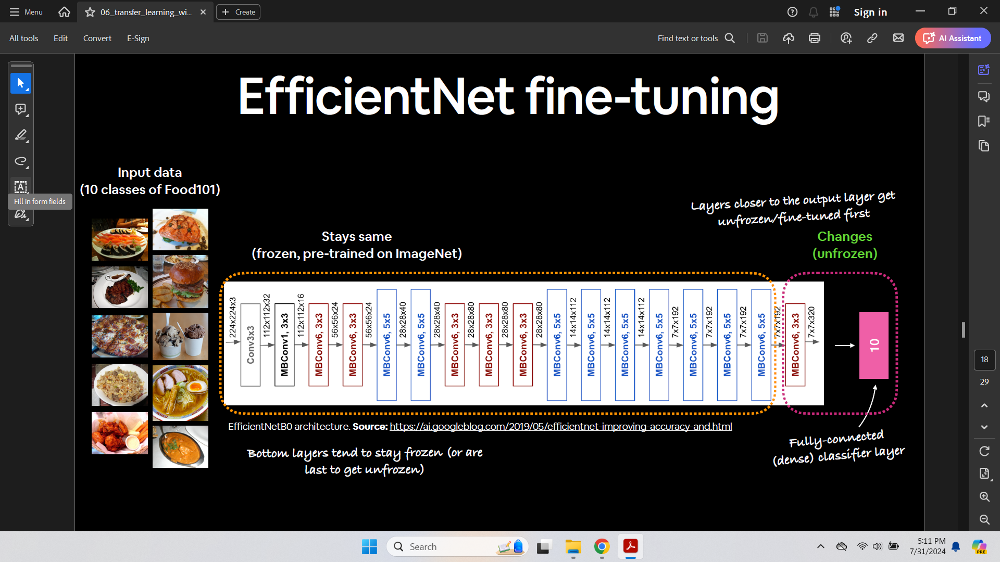

In [15]:
# Unfreeze all the layers of the base model
base_model.trainable = True

# Refreeze every layer except for the last 5
for layer in base_model.layers[:-5]:
  layer.trainable=False

In [16]:
# for layer in base_model.layers:
#   print(layer.name, layer.trainable)

In [17]:
# Recompile the model with a lower learning rate
model.compile(loss = "categorical_crossentropy",
              optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
              metrics = ["accuracy"])

In [18]:
# which layers in the model are trainable
for layer in model.layers:
  print(layer.name, layer.trainable)

input_layer True
data_augmentation True
efficientnetb0 True
global_average_pooling True
output_layer True


In [19]:
# check which layes in our base model are trainable
for layer_number, layer in enumerate(model.layers[2].layers):
  print(layer_number, layer.name, layer.trainable)

0 input_layer False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze Fals

Another 5 epochs should be enough to see whether any benefits come about (though we could always try more).

We'll start the training off where the feature extraction model left off using the initial_epoch parameter in the fit() function.

In [20]:
# Fit the model
fine_tune_epochs = 10 # since the model has already done 5 epochs, this is the total number of epochs we are after

history_all_classes_10_percent_fine_tune = model.fit(train_data_all_10_percent,
                                                     epochs = fine_tune_epochs,
                                                     validation_data = test_data,
                                                     validation_steps = int(0.15*len(test_data)),
                                                     initial_epoch = history_all_classes_10_percent.epoch[-1]) # starting from previous last epoch

Epoch 5/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step - accuracy: 0.5733 - loss: 1.7909 - val_accuracy: 0.4876 - val_loss: 2.0123
Epoch 6/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.6287 - loss: 1.5508 - val_accuracy: 0.5320 - val_loss: 1.7665
Epoch 7/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.6396 - loss: 1.4802 - val_accuracy: 0.5943 - val_loss: 1.5970
Epoch 8/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - accuracy: 0.6540 - loss: 1.3931 - val_accuracy: 0.5765 - val_loss: 1.6369
Epoch 9/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.6759 - loss: 1.3396 - val_accuracy: 0.6226 - val_loss: 1.4306
Epoch 10/10
237/237 ━━━━━━━━━━━━━━━━━━━━ 23s 97ms/step - accuracy: 0.6829 - loss: 1.2763 - val_accuracy: 0.5916 - val_loss: 1.4859


In [21]:
# evaluate the model on the complete test data
model.evaluate(test_data)

790/790 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - accuracy: 0.5518 - loss: 1.7122


[1.6179274320602417, 0.572475254535675]

We got a slight boost in our model performance after fine tuning taking the accuracy from 53% to 57%.

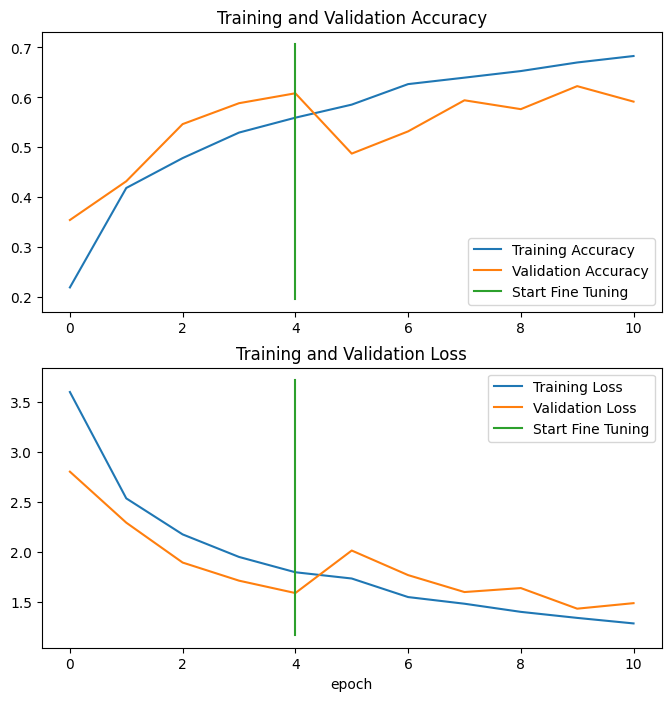

In [22]:
# Compare the history of feature extraction model with fine tuned model
compare_historys(original_history=history_all_classes_10_percent,
                 new_history = history_all_classes_10_percent_fine_tune)

## Saving our Trained Model

In [23]:
# # Save model to drive in keras format so it can be used later
model.save("/content/drive/MyDrive/TensorflowPractice/101_food_classes_10_percent_saved_big_dog_model.keras")

In [24]:
# Load and Evaluate the saved model
loaded_model = tf.keras.models.load_model("/content/drive/MyDrive/TensorflowPractice/101_food_classes_10_percent_saved_big_dog_model.keras")

In [ ]:
# Recompile the model, for consistency (sometimes loaded model may not give the same result as saved model)

model.compile(loss = "categorical_crossentropy",
              optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
              metrics = ["accuracy"])

In [25]:
# Evaluate Loaded Model and compare performance to pre-saved model
loaded_model_results = loaded_model.evaluate(test_data)
loaded_model_results

790/790 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - accuracy: 0.5253 - loss: 1.8297


[1.6916718482971191, 0.5560396313667297]

## Evaluating the performance of the big dog model across all different classes

We've got a trained and saved model which according to the evaluation metrics we've used is performing fairly well.

But metrics schmetrics, let's dive a little deeper into our model's performance and get some visualizations going.

To do so, we'll load in the saved model and use it to make some predictions on the test dataset.

In [27]:
model = loaded_model

In [28]:
# Evalute the model results
loaded_loss, loaded_accuracy = model.evaluate(test_data)
loaded_loss, loaded_accuracy

790/790 ━━━━━━━━━━━━━━━━━━━━ 32s 40ms/step - accuracy: 0.5253 - loss: 1.8297


(1.6916718482971191, 0.5560396313667297)

## Making predictions with our trained model

To evaluate our trained model, we need to make some predictions with it and then compare those predictions to the test dataset.

Because the model has never seen the test dataset, this should give us an indication of how the model will perform in the real world on data similar to what it has been trained on.

To make predictions with our trained model, we can use the predict() method passing it the test data.

Since our data is multi-class, doing this will return a prediction probably tensor for each sample.

In other words, every time the trained model see's an image it will compare it to all of the patterns it learned during training and return an output for every class (all 101 of them) of how likely the image is to be that class.

In [29]:
# making Predictions with model
preds_probs = model.predict(test_data, verbose=1) # set verbosity to see progress

790/790 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step


In [30]:
len(test_data)

790

this shows the number of batches we fed into the model to predict. We can see that if we multiple 790*32(batch size), we get 25280. And, we know from initial analysis that our testing data has 25250 images. It basically rounded up the last batch of images.

In [31]:
# how many predictions are there
len(preds_probs)

25250

In [32]:
# looking at the shape of the predictions
preds_probs.shape

(25250, 101)

In [39]:
# how do they look (look at the first 10 predictions)
preds_probs[:10]

array([[1.6427356e-01, 4.0461663e-03, 6.4686172e-02, ..., 1.8535492e-04,
        6.8512972e-04, 1.4059335e-02],
       [9.3952036e-01, 1.7253481e-06, 2.8206917e-04, ..., 6.9656741e-04,
        5.7565347e-07, 2.3102455e-05],
       [3.1921220e-01, 3.2800555e-03, 1.8047481e-03, ..., 3.0130581e-03,
        1.2345589e-04, 6.4235465e-03],
       ...,
       [2.1636830e-01, 8.8203360e-06, 2.6734598e-04, ..., 4.5621261e-02,
        1.0583903e-04, 4.7200016e-04],
       [3.1631440e-02, 9.5921697e-04, 1.0437904e-02, ..., 2.2989514e-03,
        1.2868595e-04, 6.8499503e-04],
       [1.9869182e-01, 1.8048540e-05, 1.1691803e-03, ..., 8.5646240e-03,
        5.3636359e-06, 2.9621732e-03]], dtype=float32)

In [40]:
# Looking at the predictions for the last image
print(len(preds_probs[-1]))
print('\n')
print(preds_probs[-1])
print('\n')
print(sum(preds_probs[-1]))  # the sum of all the probabilities should be 1

101


[1.31896408e-02 1.08162155e-02 1.56310620e-03 6.29596661e-06
 2.45973177e-04 1.58283058e-06 1.23850856e-04 9.13538486e-07
 8.00036767e-04 4.99701200e-05 6.98186574e-04 1.25728729e-05
 1.78853821e-04 1.29296386e-05 6.75789546e-04 4.24359132e-05
 1.05778774e-04 1.62691475e-04 5.98443403e-05 4.04396815e-05
 1.14639048e-02 9.37721998e-05 5.27448501e-05 9.66596790e-03
 4.58315080e-05 3.11429932e-04 3.92483955e-04 2.62538175e-04
 3.62280058e-04 4.58392407e-07 1.12889556e-05 6.01486827e-04
 1.53514644e-04 1.20816054e-04 2.35947505e-06 8.72553937e-05
 2.89679920e-05 3.30474839e-04 6.02334680e-04 3.49449838e-04
 2.95927259e-03 3.15715180e-04 4.54550311e-02 5.90644777e-04
 9.06000707e-07 1.60068998e-06 3.21723428e-03 4.64443612e-04
 1.99866832e-07 4.85533737e-02 9.03767999e-03 1.59683168e-05
 8.10867026e-02 3.61142913e-04 1.68785518e-05 2.10782600e-05
 2.74301638e-05 2.00425166e-05 1.18141616e-05 1.64641044e-03
 3.04683817e-05 4.28308849e-04 2.52124877e-03 3.50683740e-06
 2.86953559e-06 1.

What we've got is often referred to as a predictions probability tensor (or array). So, there are 101 predictions for each of the test image data. The class with highest prediction probability is our model's prediction.

In [46]:
# WE get 1 prediction probability per class, in our case we have 101 prediction probabilities
pred_var = preds_probs[6]

print(f"Number of prediction probabilities for sample 0: {len(pred_var)}" )
print(f"What prediction probability sample 0 looks like: \n {pred_var}")
print(f"The class with the highest predicted probability by the model for sample 0: {pred_var.argmax()}")

Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looks like: 
 [3.5747241e-02 2.1184568e-04 2.0345922e-03 4.3632795e-06 1.0693665e-04
 4.1568405e-06 1.3270485e-04 5.5958225e-08 1.9995980e-03 1.0326827e-06
 1.2274954e-05 2.5989807e-06 2.7071210e-03 4.4620338e-06 1.8210797e-02
 7.6774159e-05 3.4288951e-04 1.5238057e-02 2.9257923e-05 1.7685807e-06
 2.8147131e-05 7.2059095e-02 9.2381909e-02 1.5081802e-02 5.2466071e-06
 5.4670766e-04 7.0369913e-04 4.0379590e-03 1.2708959e-05 4.8368022e-01
 8.9709908e-07 1.3454071e-01 5.8075835e-05 1.7828701e-04 1.6624080e-07
 9.2397931e-06 1.6390020e-04 3.7081845e-04 6.1946607e-06 1.5322001e-04
 4.3208129e-05 4.0076798e-06 1.3241700e-04 3.5264216e-06 7.0124715e-06
 1.1172908e-04 2.0092297e-03 2.1728265e-06 2.8055249e-06 1.6452090e-03
 6.3184369e-04 1.0515438e-05 3.3722005e-03 1.1848640e-02 4.8500631e-05
 2.7534322e-04 1.0061191e-05 6.0166762e-04 4.0290406e-04 1.9367833e-05
 9.8003156e-06 1.8746689e-05 6.7201249e-06 2

In [47]:
test_data.class_names[29]

'cup_cakes'

So, according to our model predictions, the model predicts the 6th sample image to be a cup_cake

In [49]:
# Get the Prediction Classes for each label
pred_classes = preds_probs.argmax(axis=1)

# how do they look
pred_classes[:10]

array([ 0,  0,  0, 80,  8, 78, 29, 62,  9, 76])

In [50]:
# How many pred classes do we have
len(pred_classes)

25250

Beautiful! We've now got the predicted class index for each of the samples in our test dataset.

We'll be able to compare these to the test dataset labels to further evaluate our model.

To get the test dataset labels we can unravel our `test_data` object (which is in the form of a `tf.data.Dataset`) using the `unbatch()` method.

Doing this will give us access to the images and labels in the test dataset. Since the labels are in one-hot encoded format, we'll take use the `argmax()` method to return the index of the label.

🔑 Note: This unravelling is why we `shuffle=False` when creating the test data object. Otherwise, whenever we loaded the test dataset (like when making predictions), it would be shuffled every time, meaning if we tried to compare our predictions to the labels, they would be in different orders

In [51]:
test_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

In [53]:
# To get our test labels we need to unravel our test_data BatchDataset
y_labels = []
for images, labels in test_data.unbatch():  # unbatch the test data and get images and labels
  y_labels.append(labels.numpy().argmax())  # append the index which has the largest value (labels are one-hot)

# look at the first 10
y_labels[:10] # check what they look like (unshuffled)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

Nice! Since test_data isn't shuffled, the y_labels array comes back in the same order as the pred_classes array. The 0 indicates class 0 (as we didn't shuffle the test dataset, we will get all the class labels numerically)

In [54]:
# how many y_labels are there
len(y_labels)

25250

## Evaluating our Model's Predictions
A very simple evaluation is to use Scikit-Learn's `accuracy_score()` function which compares truth labels to predicted labels and returns an accuracy score.

If we've created our `y_labels` and `pred_classes` arrays correctly, this should return the same accuracy value (or at least very close) as the evaluate() method we used earlier.


In [57]:
loaded_model_results

[1.6916718482971191, 0.5560396313667297]

In [59]:
# Let's try scikit learn's accuracy score function
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true = y_labels,
                                  y_pred = pred_classes)

sklearn_accuracy

0.5560396039603961

In [60]:
# Does the evaluate method compare to the Scikit-Learn measured accuracy?
import numpy as np
print(f"Close? {np.isclose(loaded_accuracy, sklearn_accuracy)} | Difference: {loaded_accuracy - sklearn_accuracy}")

Close? True | Difference: 2.7406333646950998e-08


## Looking at model Predictions using Confusion Matrix

In [62]:
class_names = test_data.class_names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [67]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [68]:
# from helper_functions import make_confusion_matrix

make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(100, 100),
                      text_size=20,
                      norm=False,
                      savefig=True)

## Classification Report

In [69]:
from sklearn.metrics import classification_report
print(classification_report(y_labels, pred_classes))

              precision    recall  f1-score   support

           0       0.37      0.12      0.18       250
           1       0.39      0.74      0.51       250
           2       0.80      0.34      0.47       250
           3       0.87      0.43      0.57       250
           4       0.47      0.53      0.50       250
           5       0.40      0.30      0.34       250
           6       0.85      0.60      0.70       250
           7       0.72      0.79      0.75       250
           8       0.31      0.43      0.36       250
           9       0.33      0.70      0.45       250
          10       0.40      0.40      0.40       250
          11       0.88      0.41      0.56       250
          12       0.69      0.50      0.58       250
          13       0.37      0.64      0.47       250
          14       0.49      0.52      0.51       250
          15       0.48      0.26      0.34       250
          16       0.74      0.38      0.50       250
          17       0.34    

The `classification_report()` outputs the precision, recall and f1-score's per class.

- `Precision` - Proportion of true positives over total number of samples. Higher precision leads to less false positives (model predicts 1 when it should've been 0).
- `Recall` - Proportion of true positives over total number of true positives and false negatives (model predicts 0 when it should've been 1). Higher recall leads to less false negatives.
- `F1 score` - Combines precision and recall into one metric. 1 is best, 0 is worst.
The above output is helpful but with so many classes, it's a bit hard to understand.

Let's see if we make it easier with the help of a visualization.



In [70]:
# get a dictionary of classificatino report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
classification_report_dict

{'0': {'precision': 0.3670886075949367,
  'recall': 0.116,
  'f1-score': 0.17629179331306993,
  'support': 250.0},
 '1': {'precision': 0.3924050632911392,
  'recall': 0.744,
  'f1-score': 0.5138121546961325,
  'support': 250.0},
 '2': {'precision': 0.8,
  'recall': 0.336,
  'f1-score': 0.47323943661971835,
  'support': 250.0},
 '3': {'precision': 0.8699186991869918,
  'recall': 0.428,
  'f1-score': 0.5737265415549598,
  'support': 250.0},
 '4': {'precision': 0.475,
  'recall': 0.532,
  'f1-score': 0.5018867924528301,
  'support': 250.0},
 '5': {'precision': 0.39790575916230364,
  'recall': 0.304,
  'f1-score': 0.3446712018140589,
  'support': 250.0},
 '6': {'precision': 0.847457627118644,
  'recall': 0.6,
  'f1-score': 0.7025761124121779,
  'support': 250.0},
 '7': {'precision': 0.7163636363636363,
  'recall': 0.788,
  'f1-score': 0.7504761904761905,
  'support': 250.0},
 '8': {'precision': 0.3092485549132948,
  'recall': 0.428,
  'f1-score': 0.35906040268456374,
  'support': 250.0},
 

In [71]:
class_names[70]

'pad_thai'

## Plotting F1 score of all our classes


In [72]:
classification_report_dict["99"]["f1-score"]

0.28923076923076924

In [76]:
# create empty dictionary
class_f1_scores = {}

# loop through classification report dicionary items
for k, v in classification_report_dict.items():
  if k == "accuracy": # stop once we get to accuracy key
    break
  else:
    # Add class names and f1 scoes to new dictionary
    class_f1_scores[class_names[int(k)]] = v["f1-score"]



# get the f1 scores for each clas
class_f1_scores

{'apple_pie': 0.17629179331306993,
 'baby_back_ribs': 0.5138121546961325,
 'baklava': 0.47323943661971835,
 'beef_carpaccio': 0.5737265415549598,
 'beef_tartare': 0.5018867924528301,
 'beet_salad': 0.3446712018140589,
 'beignets': 0.7025761124121779,
 'bibimbap': 0.7504761904761905,
 'bread_pudding': 0.35906040268456374,
 'breakfast_burrito': 0.4478371501272264,
 'bruschetta': 0.4031936127744511,
 'caesar_salad': 0.5613079019073569,
 'cannoli': 0.5813953488372093,
 'caprese_salad': 0.46764705882352936,
 'carrot_cake': 0.5057915057915058,
 'ceviche': 0.33507853403141363,
 'cheese_plate': 0.5013192612137203,
 'cheesecake': 0.4,
 'chicken_curry': 0.45106382978723397,
 'chicken_quesadilla': 0.6245059288537549,
 'chicken_wings': 0.5270758122743682,
 'chocolate_cake': 0.501240694789082,
 'chocolate_mousse': 0.2292993630573248,
 'churros': 0.7229437229437229,
 'clam_chowder': 0.6233766233766234,
 'club_sandwich': 0.6198347107438017,
 'crab_cakes': 0.3904235727440147,
 'creme_brulee': 0.690518

In [78]:
# Turn the f1-scores into a data fram for visual
import pandas as pd

f1_scores = pd.DataFrame({"class_names": list(class_f1_scores.keys()),
                         "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)


In [80]:
f1_scores[:20]

,class_names,f1-score
33,edamame,0.939623
32,dumplings,0.858351
91,spaghetti_carbonara,0.851406
75,pho,0.844262
86,sashimi,0.828025
54,hot_and_sour_soup,0.820116
45,frozen_yogurt,0.819127
63,macarons,0.804762
51,guacamole,0.801418
55,hot_dog,0.800781


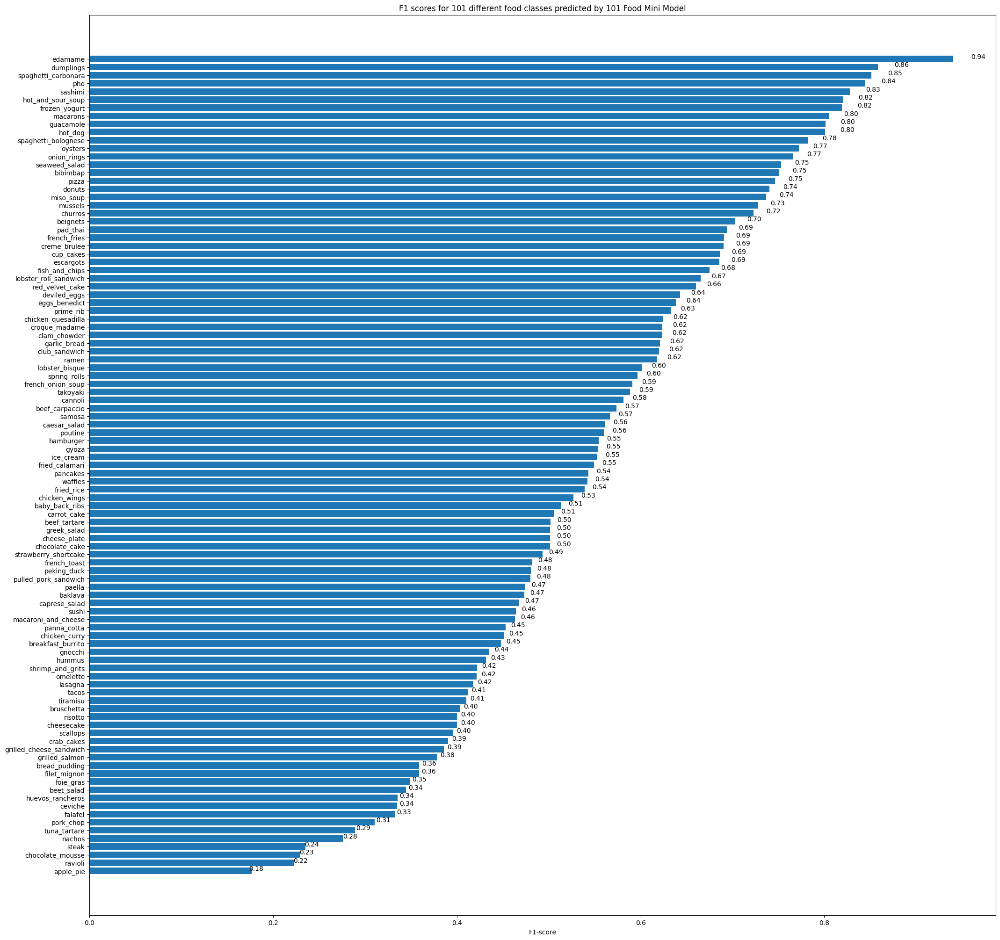

In [86]:
import matplotlib.pyplot as plt

fig, ax =  plt.subplots(figsize=(25, 25))
scores = ax.barh(range(len(f1_scores)),
                 f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores["class_names"])
ax.set_xlabel("F1-score")
ax.set_title("F1 scores for 101 different food classes predicted by 101 Food Mini Model")
ax.invert_yaxis()



# Adds values to the plot
def autolabel(rects): # Modified version of: https://matplotlib.org/examples/api/barchart_demo.html
  """
  Attach a text label above each bar displaying its height (it's value).
  """
  for rect in rects:
    width = rect.get_width()
    ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
            f"{width:.2f}",
            ha='center', va='bottom')

autolabel(scores)


## Visualizing Predictions on Test Images

 to begin predicting on any given image, we'll create a function to load an image into a tensor.

Specifically, it'll:

- Read in a target image filepath using `tf.io.read_file()`.
- Turn the image into a `Tensor` using `tf.io.decode_image()`.
- Resize the image to be the same size as the images our model has been trained on (224 x 224) using `tf.image.resize()`.
- Scale the image to get all the pixel values between 0 & 1 if necessary.

In [87]:
# Create a function to load and prepare Image
def load_and_prep_images(filename, img_shape=224, scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  (224, 224, 3).

  Parameters
  ----------
  filename (str): string filename of target image
  img_shape (int): size to resize target image to, default 224
  scale (bool): whether to scale pixel values to range(0, 1), default True
  """
  # Reads in an image
  img = tf.io.read_file(filename)

  # Decode image into tensor
  img = tf.io.decode_image(img, channels=3)

  # resize the image
  img = tf.image.resize(img, [img_shape, img_shape])

  # scale
  if scale:
    # rescale the image (get all images between 0 and 1)
    return img/255.
  else:
    return img # don't need to rescale incase of efficientnet

Now that we've got a function to load and prepare target images, let's now write some code to visualize images, their target label and our model's predictions.

Specifically, we'll write some code to:
- Load a few random images from the test dataset
- Make predictions on the loaded images
- plot the original image(s) along with the model's predictions, prediction probability and ground truth label

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


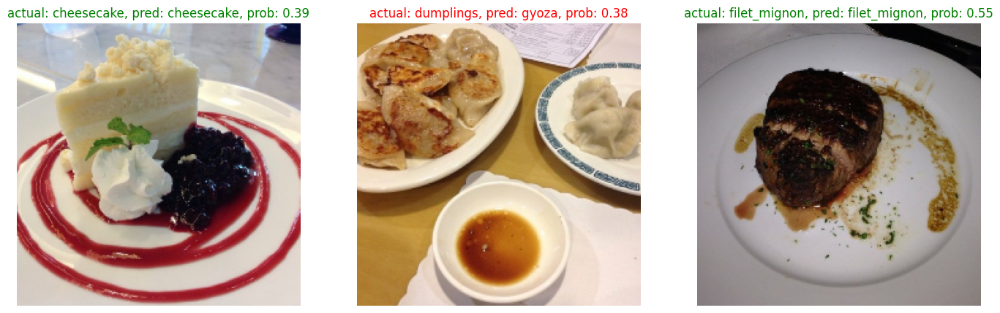

In [90]:
# Make preds on a series of random images
import os
import random

plt.figure(figsize=(17, 10))
for i in range(3):
  # Choose a random image from a random class
  class_name = random.choice(class_names)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir + class_name + "/" + filename

  # Load the image and make predictions
  img = load_and_prep_images(filepath, scale=False) # don't scale images for EfficientNet predictions
  pred_prob = model.predict(tf.expand_dims(img, axis=0)) # model accepts tensors of shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] # find the predicted class

  # Plot the image(s)
  plt.subplot(1, 3, i+1)
  plt.imshow(img/255.)
  if class_name == pred_class: # Change the color of text based on whether prediction is right or wrong
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);

After going through enough random samples, it starts to become clear that the model tends to make far worse predictions on classes which are visually similar such as baby_back_ribs getting mistaken as steak and vice versa

## Finding the most wrong predictions

 We notice the model predicting on some images with a very high prediction probability, meaning it's very confident with its prediction but still getting the label wrong.

These **most wrong predictions** can help to give further insight into your model's performance.

So how about we write some code to collect all of the predictions where the model has output a high prediction probability for an image (e.g. 0.95+) but gotten the prediction wrong.

We'll go through the following steps:

- Get all of the image file paths in the test dataset using the list_files() method.
- Create a pandas DataFrame of the image filepaths, ground truth labels, prediction classes, max prediction probabilities, ground truth class names and predicted class names.
- Use our DataFrame to find all the wrong predictions (where the ground truth doesn't match the prediction).
- Sort the DataFrame based on wrong predictions and highest max prediction probabilities.
- Visualize the images with the highest prediction probabilities but have the wrong prediction.

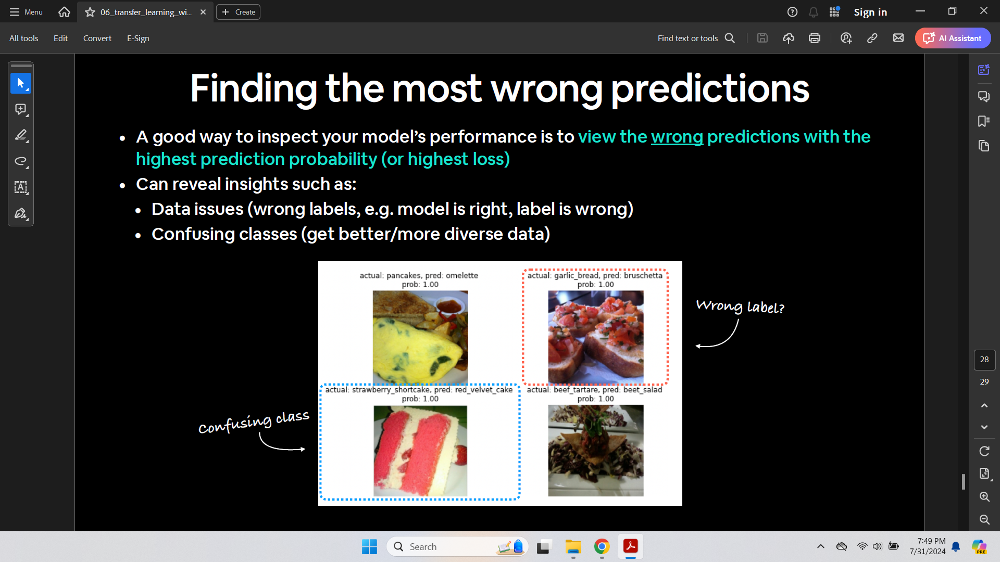

In [91]:
# 1. Get the filenames of all of our test data
filepaths = []
for filepath in test_data.list_files("101_food_classes_10_percent/test/*/*.jpg",
                                     shuffle=False):
  filepaths.append(filepath.numpy())


filepaths[:10]

[b'101_food_classes_10_percent/test/apple_pie/1011328.jpg',
 b'101_food_classes_10_percent/test/apple_pie/101251.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1034399.jpg',
 b'101_food_classes_10_percent/test/apple_pie/103801.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1038694.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1047447.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1068632.jpg',
 b'101_food_classes_10_percent/test/apple_pie/110043.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1106961.jpg',
 b'101_food_classes_10_percent/test/apple_pie/1113017.jpg']

Now we've got all of the test image filepaths, let's combine them into a DataFrame along with:

- Their ground truth labels (y_labels).
- The class the model predicted (pred_classes).
- The maximum prediction probabilitity value (pred_probs.max(axis=1)).
- The ground truth class names.
- The predicted class names.

In [93]:
# Create a dataframe out of current prediction data for analysis

import pandas as pd
pred_df = pd.DataFrame({"img_path": filepaths,
                       "y_true": y_labels,
                       "y_pred": pred_classes,
                       "pred_conf": preds_probs.max(axis=1), # get the max prediction probability value
                       "y_true_classname": [class_names[i] for i in y_labels],
                       "y_pred_classname": [class_names[i] for i in pred_classes]})

In [94]:
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.164274,apple_pie,apple_pie
1,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.939520,apple_pie,apple_pie
2,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.319212,apple_pie,apple_pie
3,b'101_food_classes_10_percent/test/apple_pie/1...,0,80,0.153693,apple_pie,pulled_pork_sandwich
4,b'101_food_classes_10_percent/test/apple_pie/1...,0,8,0.245064,apple_pie,bread_pudding
...,...,...,...,...,...,...
25245,b'101_food_classes_10_percent/test/waffles/942...,100,100,0.950028,waffles,waffles
25246,b'101_food_classes_10_percent/test/waffles/954...,100,100,0.905109,waffles,waffles
25247,b'101_food_classes_10_percent/test/waffles/961...,100,100,0.571588,waffles,waffles
25248,b'101_food_classes_10_percent/test/waffles/970...,100,94,0.180252,waffles,strawberry_shortcake


In [96]:
# Create a new column which tells us wrong prediction
pred_df["pred_correct"] = pred_df["y_true_classname"] == pred_df["y_pred_classname"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.164274,apple_pie,apple_pie,True
1,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.939520,apple_pie,apple_pie,True
2,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.319212,apple_pie,apple_pie,True
3,b'101_food_classes_10_percent/test/apple_pie/1...,0,80,0.153693,apple_pie,pulled_pork_sandwich,False
4,b'101_food_classes_10_percent/test/apple_pie/1...,0,8,0.245064,apple_pie,bread_pudding,False


In [100]:
# Sort the dataframe to have most wrong predictions on top
top_100_wrong = pred_df[pred_df["pred_correct"]==False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
23631,b'101_food_classes_10_percent/test/strawberry_...,94,83,0.998371,strawberry_shortcake,red_velvet_cake,False
23797,b'101_food_classes_10_percent/test/sushi/16593...,95,86,0.997200,sushi,sashimi,False
14255,b'101_food_classes_10_percent/test/hummus/1071...,57,49,0.994610,hummus,grilled_cheese_sandwich,False
22,b'101_food_classes_10_percent/test/apple_pie/1...,0,100,0.993360,apple_pie,waffles,False
17897,b'101_food_classes_10_percent/test/paella/2986...,71,65,0.991558,paella,mussels,False
9202,b'101_food_classes_10_percent/test/falafel/390...,36,20,0.990842,falafel,chicken_wings,False
5652,b'101_food_classes_10_percent/test/chocolate_m...,22,98,0.990354,chocolate_mousse,tiramisu,False
11642,b'101_food_classes_10_percent/test/garlic_brea...,46,10,0.988463,garlic_bread,bruschetta,False
10179,b'101_food_classes_10_percent/test/french_frie...,40,20,0.988386,french_fries,chicken_wings,False
6108,b'101_food_classes_10_percent/test/clam_chowde...,24,27,0.987795,clam_chowder,creme_brulee,False


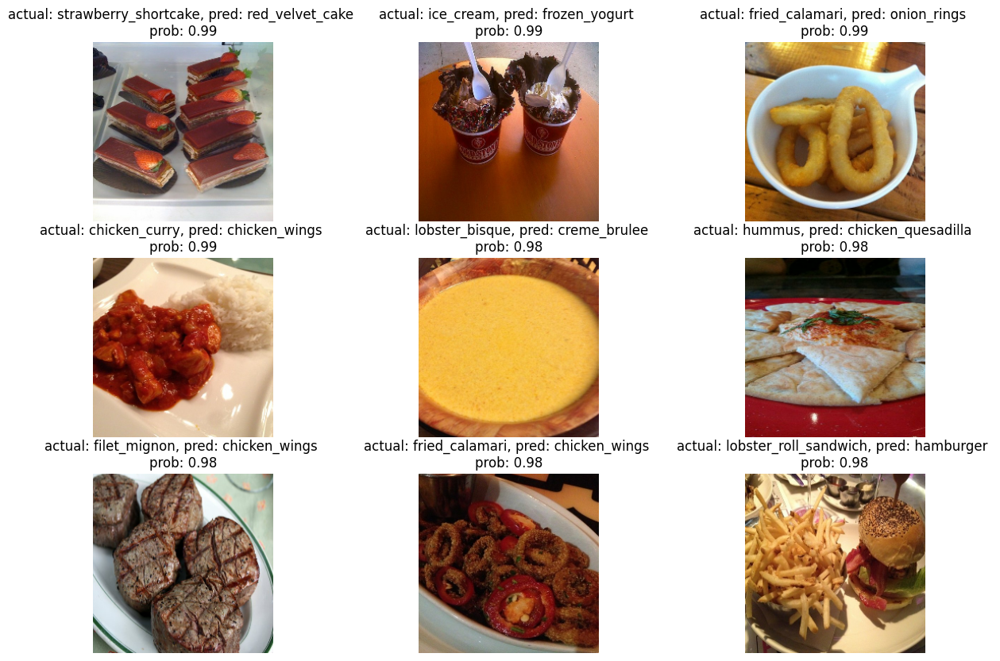

In [102]:
# Visualize some of the most wrong examples
images_to_view = 9
start_index = 10 # change the start index to view more

plt.figure(figsize=(15,10))

for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
  plt.subplot(3,3,i+1)
  img = load_and_prep_images(row[1], scale=True)
  _, _, _, _, pred_prob, y_true, y_pred, _ = row # only interested in a few parameters of each row
  plt.imshow(img)
  plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
  plt.axis(False)

Going through the model's most wrong predictions can usually help figure out a couple of things:

- Some of the labels might be wrong - If our model ends up being good enough, it may actually learning to predict very well on certain classes. This means some images which the model predicts the right label may show up as wrong if the ground truth label is wrong. If this is the case, we can often use our model to help us improve the labels in our dataset(s) and in turn, potentially making future models better. This process of using the model to help improve labels is often referred to as [`active learning`](https://blog.scaleway.com/active-learning-some-datapoints-are-more-equal-than-others/).
- Could more samples be collected? - If there's a recurring pattern for a certain class being poorly predicted on, perhaps it's a good idea to collect more samples of that particular class in different scenarios to improve further models.

## Test the Model on Test Images as well as Custom Images of Food

In [104]:
# Download some custom images from Google Storage
# Note: you can upload your own custom images to Google Colab using the "upload" button in the Files tab
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

unzip_data("custom_food_images.zip")

--2024-08-01 01:16:33--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.141.207, 142.251.2.207, 74.125.137.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.141.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: ‘custom_food_images.zip’

custom_food_images. 100%[===================>]  12.58M  42.8MB/s    in 0.3s    

2024-08-01 01:16:33 (42.8 MB/s) - ‘custom_food_images.zip’ saved [13192985/13192985]



In [105]:
# Get custom food images filepaths
custom_food_images = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]
custom_food_images


['custom_food_images/ramen.jpeg',
 'custom_food_images/steak.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/chicken_wings.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/sushi.jpeg']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


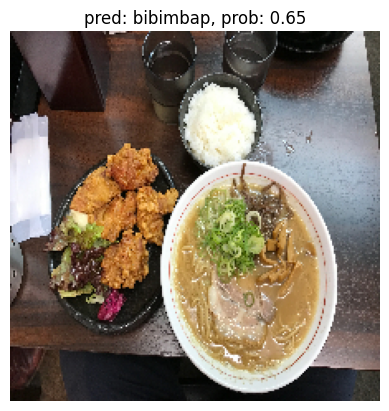

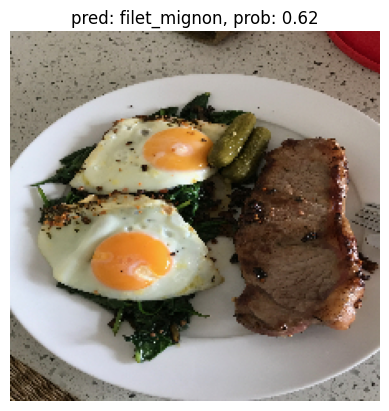

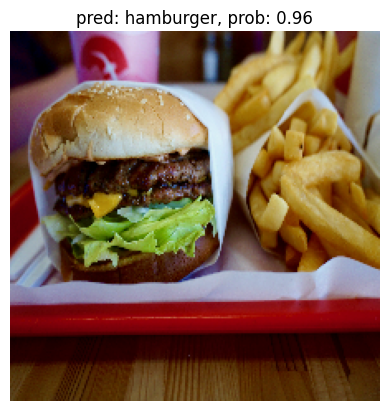

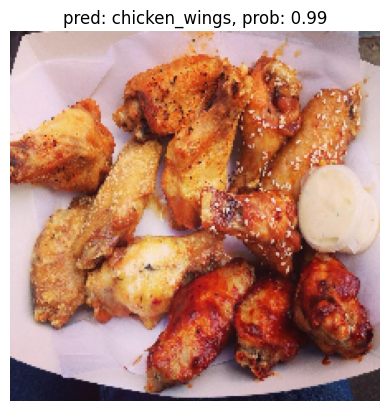

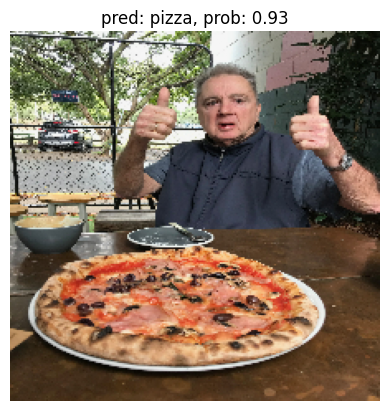

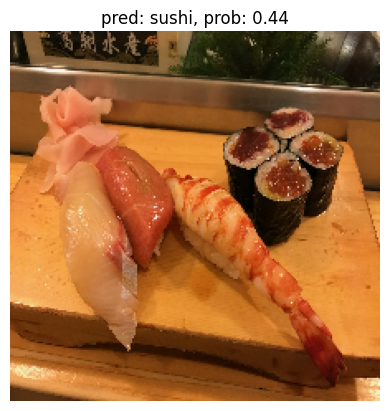

In [107]:

# Make predictions on custom food images
for img in custom_food_images:
  img = load_and_prep_images(img, scale=False) # load in target image and turn it into tensor
  pred_prob = model.predict(tf.expand_dims(img, axis=0)) # make prediction on image with shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] # find the predicted class label
  # Plot the image with appropriate annotations
  plt.figure()
  plt.imshow(img/255.) # imshow() requires float inputs to be normalized
  plt.title(f"pred: {pred_class}, prob: {pred_prob.max():.2f}")
  plt.axis(False)